In [1]:
import random
from pathlib import Path
from tqdm import tqdm
from IPython.display import display, Image as IPImage
import json
from datetime import datetime
import base64

In [2]:
from google import genai
from google.genai import types
from dotenv import load_dotenv
import os

load_dotenv()
GOOGLE_API_KEY = os.getenv('GOOGLE_API_KEY')
client = genai.Client(api_key=GOOGLE_API_KEY)
# MODEL_ID = "gemini-2.5-flash-image"
MODEL_ID = "gemini-3-pro-image-preview"
print(f"✓ Client initialized: {MODEL_ID}")

Both GOOGLE_API_KEY and GEMINI_API_KEY are set. Using GOOGLE_API_KEY.


✓ Client initialized: gemini-3-pro-image-preview


## Load CSV and Create Batch File for Prompt Variations

In [4]:
import pandas as pd
import re

# Load the CSV file with base prompts and variations
csv_path = './prompt_base_and_variations_full.csv'
df = pd.read_csv(csv_path)

print(f"✓ Loaded CSV: {csv_path}")
print(f"  Total rows: {len(df)}")
print(f"  Columns: {list(df.columns)}")
print(f"\nFirst row preview:")
print(f"  Images: {df.loc[0, 'Images']}")
print(f"  Gender: {df.loc[0, 'gender']}")
print(f"  Base prompt length: {len(str(df.loc[0, 'base_prompt']))}")
print(f"  Variation 1 prompt length: {len(str(df.loc[0, 'variation_1_prompt']))}")

# Check for missing data
missing_counts = df.isnull().sum()
print(f"\nMissing data:")
for col in df.columns:
    if missing_counts[col] > 0:
        print(f"  {col}: {missing_counts[col]} missing")

✓ Loaded CSV: ./prompt_base_and_variations_full.csv
  Total rows: 199
  Columns: ['Images', 'gender', 'image_path', 'base_prompt', 'variation_1_prompt', 'variation_2_prompt', 'variation_3_prompt', 'variation_4_prompt']

First row preview:
  Images: 1.jpg
  Gender: male
  Base prompt length: 1449
  Variation 1 prompt length: 2107

Missing data:
  variation_1_prompt: 195 missing
  variation_2_prompt: 195 missing
  variation_3_prompt: 196 missing
  variation_4_prompt: 197 missing


In [5]:
df.head()

,Images,gender,image_path,base_prompt,variation_1_prompt,variation_2_prompt,variation_3_prompt,variation_4_prompt
0,1.jpg,male,/home/hungnq/hungnq/sd_stuff/datahub/dataset_2...,A highly realistic portrait photograph of a cu...,"Preserve the light, background, expression of ...","Preserve the light, background, expression of ...","Preserve the light, background, expression of ...","Preserve the light, background, expression of ..."
1,2.jpg,male,/home/hungnq/hungnq/sd_stuff/datahub/dataset_2...,A highly realistic portrait photograph of a cu...,"Preserve the light, background, expression of ...","Preserve the light, background, expression of ...","Preserve the light, background, expression of ...","Preserve the light, background, expression of ..."
2,3.jpg,male,/home/hungnq/hungnq/sd_stuff/datahub/dataset_2...,A highly realistic portrait photograph of a cu...,"Preserve the light, background, expression of ...","Preserve the light, background, expression of ...","Preserve the light, background, expression of ...",NaN
3,4.jpg,male,/home/hungnq/hungnq/sd_stuff/datahub/dataset_2...,A highly realistic portrait photograph of a cu...,NaN,NaN,NaN,NaN
4,5.jpg,male,/home/hungnq/hungnq/sd_stuff/datahub/dataset_2...,A highly realistic portrait photograph of a cu...,"Preserve the light, background, expression of ...","Preserve the light, background, expression of ...",NaN,NaN


### Create Batch File Function

In [6]:
def create_batch_file_from_csv(
    df: pd.DataFrame,
    output_file: str = "prompt_variations_batch.jsonl",
    include_base: bool = True,
    indices: list = None,
    temperature: float = 0.7,
    aspect_ratio: str = "1:1",
    not_include_variations: bool = False
) -> str:
    """
    Create batch file from CSV with base prompt and variations.
    
    Args:
        df: DataFrame with columns: Images, gender, base_prompt, 
            variation_1_prompt, variation_2_prompt, variation_3_prompt, variation_4_prompt
        output_file: Output JSONL file path
        include_base: Whether to include base prompt in batch
        indices: List of row indices to process (None = all rows)
        temperature: Generation temperature
        aspect_ratio: Image aspect ratio
    
    Returns:
        Path to created batch file
    """
    requests = []
    
    # Determine which rows to process
    if indices is not None:
        # Filter dataframe by provided indices
        df_to_process = df.loc[indices]
        print(f"Processing {len(df_to_process)} rows from specified indices")
    else:
        # Process all rows
        df_to_process = df
        print(f"Processing all {len(df_to_process)} rows")
    
    for idx, row in df_to_process.iterrows():
        image_name = row['Images']
        gender = row['gender']
        
        # Extract ID from image name (e.g., "1.jpg" -> 1)
        id_match = re.search(r'(\d+)', str(image_name))
        image_id = int(id_match.group(1)) if id_match else idx
        
        # Base prompt (if included)
        if include_base and pd.notna(row.get('base_prompt')):
            base_prompt = row['base_prompt']
            request_base = {
                "custom_id": f"img{image_id:04d}_base_{gender}",
                "request": {
                    "contents": [{"parts": [{"text": base_prompt}]}],
                    "generationConfig": {
                        "responseModalities": ["IMAGE"],
                        "temperature": temperature,
                        "imageConfig": {"aspectRatio": aspect_ratio}
                    }
                },
                "metadata": {
                    "image_id": image_id,
                    "image_name": image_name,
                    "gender": gender,
                    "prompt_type": "base",
                    "variation_id": 0,
                    "original_index": idx
                }
            }
            requests.append(request_base)
        
        # Variation prompts (1-4)
        if not not_include_variations:

            for var_num in range(1, 5):
                var_col = f'variation_{var_num}_prompt'
                if var_col in df.columns and pd.notna(row.get(var_col)):
                    var_prompt = row[var_col]
                    
                    request_var = {
                        "custom_id": f"img{image_id:04d}_var{var_num}_{gender}",
                        "request": {
                            "contents": [{"parts": [{"text": var_prompt}]}],
                            "generationConfig": {
                                "responseModalities": ["IMAGE"],
                                "temperature": temperature,
                                "imageConfig": {"aspectRatio": aspect_ratio}
                            }
                        },
                        "metadata": {
                            "image_id": image_id,
                            "image_name": image_name,
                            "gender": gender,
                            "prompt_type": "variation",
                            "variation_id": var_num,
                            "original_index": idx
                        }
                    }
                    requests.append(request_var)
    
    # Write to JSONL file
    with open(output_file, 'w') as f:
        for req in requests:
            f.write(json.dumps(req) + '\n')
    
    print(f"\n{'='*60}")
    print(f"Batch File Created Successfully!")
    print(f"{'='*60}")
    print(f"Output file: {output_file}")
    print(f"Total rows processed: {len(df_to_process)}")
    print(f"Total requests: {len(requests)}")
    if include_base:
        print(f"  - Base prompts: {sum(1 for r in requests if r['metadata']['prompt_type'] == 'base')}")
    print(f"  - Variation prompts: {sum(1 for r in requests if r['metadata']['prompt_type'] == 'variation')}")
    print(f"{'='*60}")
    
    return output_file

print("✓ Batch file creation function defined")

✓ Batch file creation function defined


### Create Batch File (Examples with different index selections)

In [8]:
# Example 1: Create batch file for first 10 rows using indices
# indices_first_10 = list(range(10))
# batch_file = create_batch_file_from_csv(
#     df=df,
#     output_file="prompt_variations_first_10.json",
#     include_base=True,
#     indices=indices_first_10,
#     temperature=0.7,
#     aspect_ratio="1:1",
#     not_include_variations=True
# )

# Example 2: Create batch file for specific indices (e.g., rows 5, 10, 15, 20, 25)
# specific_indices = [5, 10, 15, 20, 25]
# batch_file = create_batch_file_from_csv(
#     df=df,
#     output_file="prompt_variations_specific.json",
#     include_base=True,
#     indices=specific_indices,
#     temperature=0.7,
#     aspect_ratio="1:1"
# )

# Example 3: Create batch file for a range (e.g., rows 50-60)
range_indices = list(range(0, 50))
range_indices_2 = list(range(50, 100))
range_indices_3 = list(range(100, 150))
range_indices_4 = list(range(150, len(df
)))
batch_file = create_batch_file_from_csv(
    df=df,
    output_file="prompt_variations_range_150_200.json",
    include_base=True,
    indices=range_indices_4,
    temperature=0.7,
    aspect_ratio="1:1",
    not_include_variations=True
)

# Example 4: Create batch file for all rows (indices=None)
# batch_file = create_batch_file_from_csv(
#     df=df,
#     output_file="prompt_variations_all.json",
#     include_base=True,
#     indices=None,  # Process all rows
#     temperature=0.7,
#     aspect_ratio="1:1"
# )

# Show first request example
with open(batch_file, 'r') as f:
    first_request = json.loads(f.readline())
    print("\nFirst request preview:")
    print(f"  Custom ID: {first_request['custom_id']}")
    print(f"  Original Index: {first_request['metadata']['original_index']}")
    print(f"  Prompt preview: {first_request['request']['contents'][0]['parts'][0]['text'][:150]}...")
    print(f"  Metadata: {first_request['metadata']}")

Processing 49 rows from specified indices

Batch File Created Successfully!
Output file: prompt_variations_range_150_200.json
Total rows processed: 49
Total requests: 49
  - Base prompts: 49
  - Variation prompts: 0

First request preview:
  Custom ID: img0039_base_female
  Original Index: 150
  Prompt preview: Highly detailed photorealistic portrait of a cute 6-year-old Japanese girl, innocent and sorrowful appearance, gender female, age 6.

Face: round sh...
  Metadata: {'image_id': 39, 'image_name': 'Image_39.jpg', 'gender': 'female', 'prompt_type': 'base', 'variation_id': 0, 'original_index': 150}


# Job Functions

### Submit Batch Job

In [9]:
def submit_batch_job(batch_file: str, display_name: str = "prompt-variations-batch"):
    """Upload and submit batch job."""
    uploaded = client.files.upload(
        file=batch_file,
        config=types.UploadFileConfig(display_name=display_name)
    )
    
    job = client.batches.create(
        model=MODEL_ID,
        src=uploaded.name,
        config={'display_name': display_name}
    )
    print(f"✓ Job submitted: {job.name}")
    print(f"  Display name: {display_name}")
    print(f"  Model: {MODEL_ID}")
    return job

# Submit the batch job
job = submit_batch_job(batch_file, display_name="base-prompt-stage1-150-200-2")
job

✓ Job submitted: batches/dswis1y0tzla1u3zlpuvf9685cylc35oncei
  Display name: base-prompt-stage1-150-200-2
  Model: gemini-3-pro-image-preview


BatchJob(
  create_time=datetime.datetime(2025, 12, 30, 1, 7, 44, 782322, tzinfo=TzInfo(0)),
  display_name='base-prompt-stage1-150-200-2',
  model='models/gemini-3-pro-image-preview',
  name='batches/dswis1y0tzla1u3zlpuvf9685cylc35oncei',
  state=<JobState.JOB_STATE_PENDING: 'JOB_STATE_PENDING'>,
  update_time=datetime.datetime(2025, 12, 30, 1, 7, 44, 782322, tzinfo=TzInfo(0))
)

### Poll and Download Results

In [11]:
def poll_batch_job(job_name: str, interval: int = 30):
    """Poll job until completion."""
    import time
    
    print(f"Polling job: {job_name}")
    while True:
        job = client.batches.get(name=job_name)
        state = job.state.name
        print(f"  State: {state}")
        
        if state in ('JOB_STATE_SUCCEEDED', 'JOB_STATE_FAILED', 'JOB_STATE_CANCELLED'):
            print(f"✓ Job finished: {state}")
            if state == 'JOB_STATE_FAILED':
                print(f"  Error: {job.error}")
            return job
        
        print(f"  Waiting {interval}s...")
        time.sleep(interval)

def download_batch_results(job, output_file: str = "batch_results.jsonl"):
    """Download completed batch results."""
    results = client.files.download(file=job.dest.file_name)
    with open(output_file, 'wb') as f:
        f.write(results)
    print(f"✓ Downloaded results to: {output_file}")
    return output_file

print("✓ Batch job functions defined")

✓ Batch job functions defined


In [12]:
# Poll until complete
completed_job = poll_batch_job(job.name, interval=30)

Polling job: batches/dswis1y0tzla1u3zlpuvf9685cylc35oncei
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_PENDING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE_RUNNING
  Waiting 30s...
  State: JOB_STATE

In [14]:
# Download results
results_file = download_batch_results(completed_job, "prompt_variations_results_150_200.jsonl")

✓ Downloaded results to: prompt_variations_results_150_200.jsonl


### Alternative: Poll Existing Job

If you need to check status of an existing job:

In [ ]:
# Option 1: Poll an existing job by name
# existing_job_name = "batches/xxxxx"  # Replace with your job name
# completed_job = poll_batch_job(existing_job_name, interval=30)

# Option 2: Get job status once
# job_status = client.batches.get(name=existing_job_name)
# print(f"Job state: {job_status.state.name}")
# job_status

### List All Jobs

View all your batch jobs:

In [12]:
# List all batch jobs
print("All batch jobs:")
for batch_job in client.batches.list():
    print(f"  {batch_job.name}")
    print(f"    State: {batch_job.state.name}")
    print(f"    Display name: {batch_job.display_name}")
    if hasattr(batch_job, 'create_time'):
        print(f"    Created: {batch_job.create_time}")
    print()

All batch jobs:
  batches/4bogs9f4bsu1nj0r3198hmkuo9yxxsorlxy3
    State: JOB_STATE_SUCCEEDED
    Display name: base-prompt-stage1-0-50
    Created: 2025-12-29 16:42:27.891979+00:00



### Cancel a Job (if needed)

In [ ]:
# Uncomment to cancel a job
# job_name_to_cancel = "batches/xxxxx"  # Replace with job name
# client.batches.cancel(name=job_name_to_cancel)
# print(f"✓ Cancelled job: {job_name_to_cancel}")

### Process and Save Images

In [15]:
def process_batch_results(
    batch_result_file: str,
    output_dir: str = "./prompt_variations_images"
) -> dict:
    """
    Process batch results and save images organized by image_id and variation.
    
    Structure:
    output_dir/
      image_0001/
        base_male.png
        var1_male.png
        var2_male.png
        ...
    """
    from pathlib import Path
    
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)
    
    metadata_all = {}
    stats = {'base': 0, 'variation': 0, 'errors': 0}
    
    with open(batch_result_file, 'r') as f:
        for line in tqdm(f, desc="Processing results"):
            if not line.strip():
                continue
            
            result = json.loads(line)
            custom_id = result['custom_id']
            metadata = result.get('metadata', {})
            
            image_id = metadata.get('image_id', 0)
            gender = metadata.get('gender', 'unknown')
            prompt_type = metadata.get('prompt_type', 'unknown')
            variation_id = metadata.get('variation_id', 0)
            
            # Create image directory
            img_dir = output_path / f"image_{image_id:04d}"
            img_dir.mkdir(exist_ok=True)
            
            try:
                response_parts = result['response']['candidates'][0]['content']['parts']
                for part in response_parts:
                    if 'inlineData' in part:
                        image_data = base64.b64decode(part['inlineData']['data'])
                        
                        # Filename: base_male.png or var1_male.png
                        if prompt_type == 'base':
                            filename = f"base_{gender}.png"
                            stats['base'] += 1
                        else:
                            filename = f"var{variation_id}_{gender}.png"
                            stats['variation'] += 1
                        
                        image_path = img_dir / filename
                        
                        with open(image_path, 'wb') as img_file:
                            img_file.write(image_data)
                        
                        metadata['local_path'] = str(image_path)
                        metadata_all[custom_id] = metadata
                        break
            except Exception as e:
                print(f"  Error {custom_id}: {e}")
                stats['errors'] += 1
    
    # Save metadata
    with open(output_path / "metadata.json", 'w') as f:
        json.dump(metadata_all, f, indent=2)
    
    print(f"\n{'='*60}")
    print(f"Processing Complete!")
    print(f"{'='*60}")
    print(f"Output directory: {output_dir}")
    print(f"Total images: {len(metadata_all)}")
    print(f"  - Base prompts: {stats['base']}")
    print(f"  - Variations: {stats['variation']}")
    print(f"  - Errors: {stats['errors']}")
    print(f"Metadata saved to: {output_path / 'metadata.json'}")
    print(f"{'='*60}")
    
    return metadata_all

# Process results
metadata = process_batch_results(
    results_file,
    output_dir="./prompt_variations_images_batch_150_200_2"
)

Processing results: 21it [00:00, 203.92it/s]

  Error img0039_base_female: 'parts'
  Error img0040_base_female: 'parts'
  Error img0046_base_female: 'parts'
  Error img0017_base_female: 'parts'


Processing results: 49it [00:00, 197.13it/s]


Processing Complete!
Output directory: ./prompt_variations_images_batch_150_200_2
Total images: 42
  - Base prompts: 45
  - Variations: 0
  - Errors: 4
Metadata saved to: prompt_variations_images_batch_150_200_2/metadata.json


### Visualize Sample Results

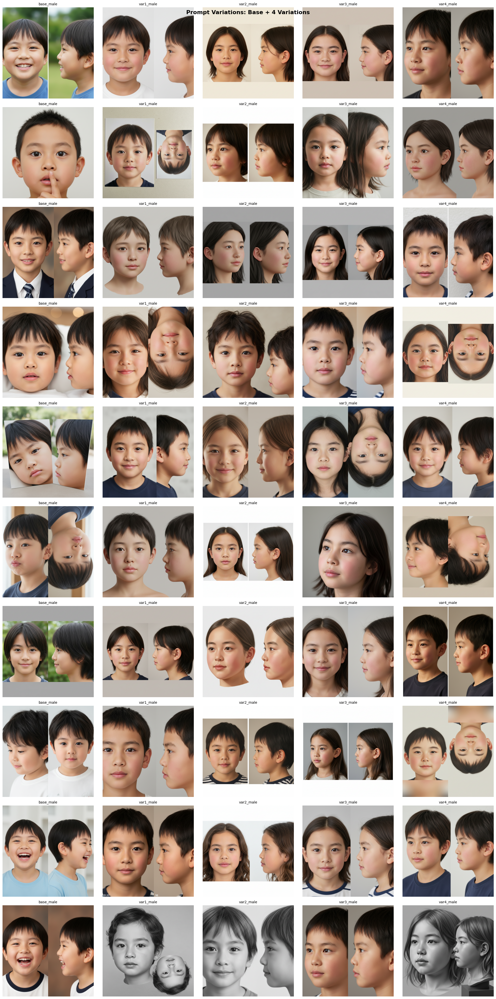

✓ Preview saved to: prompt_variations_images_test_10/variations_preview.png


In [38]:
import matplotlib.pyplot as plt
from PIL import Image

def visualize_prompt_variations(
    output_dir: str = "./prompt_variations_images_test_10",
    num_samples: int = 3
):
    """
    Visualize base + 4 variations for sample images.
    """
    from pathlib import Path
    
    output_path = Path(output_dir)
    image_dirs = sorted([d for d in output_path.iterdir() if d.is_dir()])[:num_samples]
    
    if not image_dirs:
        print("No image directories found")
        return
    
    fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4 * num_samples))
    fig.suptitle('Prompt Variations: Base + 4 Variations', fontsize=16, fontweight='bold')
    
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i, img_dir in enumerate(image_dirs):
        # Load base + variations
        image_files = ['base_male.png', 'base_female.png', 
                      'var1_male.png', 'var1_female.png',
                      'var2_male.png', 'var2_female.png',
                      'var3_male.png', 'var3_female.png',
                      'var4_male.png', 'var4_female.png']
        
        # Find which files exist
        existing = [f for f in image_files if (img_dir / f).exists()]
        
        # Display base + first 4 variations found
        for j in range(5):
            ax = axes[i, j]
            if j < len(existing):
                img_path = img_dir / existing[j]
                img = Image.open(img_path)
                ax.imshow(img)
                ax.set_title(existing[j].replace('.png', ''), fontsize=10)
            else:
                ax.text(0.5, 0.5, 'N/A', ha='center', va='center')
            ax.axis('off')
        
        axes[i, 0].set_ylabel(img_dir.name, fontsize=12, rotation=0, ha='right', va='center')
    
    plt.tight_layout()
    plt.savefig(output_path / 'variations_preview.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✓ Preview saved to: {output_path / 'variations_preview.png'}")

# Visualize
visualize_prompt_variations(
    output_dir="./prompt_variations_images_test_10",
    num_samples=10
)

### Create Full Batch File (All Rows)

Uncomment and run this cell to create batch file for all rows in CSV.

In [ ]:
# Uncomment to create batch file for ALL rows
# batch_file_full = create_batch_file_from_csv(
#     df=df,
#     output_file="prompt_variations_full.jsonl",
#     include_base=True,
#     indices=None,  # Process all rows
#     temperature=0.7,
#     aspect_ratio="1:1"
# )

# # Submit full batch
# job_full = submit_batch_job(batch_file_full, display_name="prompt-variations-full")